In [ ]:

!pip install pytorch_lightning
!pip install torchsummaryX
!pip install torchio
!pip install datasets
!pip install wandb

#!pip install -r MedicalZooPytorch/installation/requirements.txt
#!pip install torch==1.7.1+cu101 torchvision==0.8.2+cu101 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
cd drive/MyDrive/MacAI

/content/drive/MyDrive/MacAI


In [4]:
!git clone https://github.com/black0017/MedicalZooPytorch.git
!git clone https://github.com/McMasterAI/Radiology-and-AI.git

fatal: destination path 'MedicalZooPytorch' already exists and is not an empty directory.
fatal: destination path 'Radiology-and-AI' already exists and is not an empty directory.


In [5]:
import sys
sys.path.append('./Radiology_and_AI')
sys.path.append('./MedicalZooPytorch')
import os
import torch
import numpy as np
from torch.utils.data import Dataset, DataLoader, random_split
from pytorch_lightning.loggers import WandbLogger, TensorBoardLogger
import pytorch_lightning as pl

import nibabel as nb
from skimage import transform
import matplotlib.pyplot as plt
from lightning_modules.TumourSegmentation import TumourSegmentation

In [6]:
from lib.medzoo.Unet3D import UNet3D

In [7]:
from visuals.display_functions import *


In [8]:
import tqdm
import torchio as tio
subjects = []
subjects_separate = []

base_dir = './macai_datasets/brats_new/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/'
for file in tqdm.tqdm([file for file in os.listdir('./macai_datasets/brats_new/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData') if os.path.isdir(base_dir + file) == True]):
  #print(os.listdir(f'./macai_datasets/brats_new/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/{file}'))
  subject = tio.Subject(
        data = tio.ScalarImage(path = [base_dir+file +'/'+ file+'_flair.nii.gz', base_dir+file +'/'+ file+'_t1.nii.gz', base_dir+file +'/'+ file+'_t2.nii.gz', base_dir+file +'/'+ file + '_t1ce.nii.gz']),
        seg = tio.LabelMap(path=[base_dir+file  +'/'+ file+ '_seg.nii.gz']),
        name = file
      )
  subjects.append(subject)
dataset = tio.SubjectsDataset(subjects)


100%|██████████| 368/368 [00:00<00:00, 375.76it/s]


In [9]:
validation_transform = tio.Compose([
    tio.ZNormalization(),
    tio.CropOrPad((240, 240, 160)),
    tio.OneHot(num_classes=5)    
])

In [10]:
training_split_ratio = 0.9
num_subjects = len(dataset)
num_training_subjects = int(training_split_ratio * num_subjects)
num_validation_subjects = num_subjects - num_training_subjects

num_split_subjects = num_training_subjects, num_validation_subjects
training_subjects, validation_subjects = torch.utils.data.random_split(subjects, num_split_subjects)

validation_set = tio.SubjectsDataset(validation_subjects, validation_transform)
print('Validation set:', len(validation_set), 'subjects')


Validation set: 37 subjects


In [11]:
#Collate function
def col_fn(batch):
  out = dict()
  out['data'] = torch.stack([x['data']['data'].float() for x in batch])
  out['seg'] = torch.stack([x['seg']['data'].float() for x in batch])
  out['name'] = [x['name'] for x in batch]
  return out

In [12]:
output_file_path = 'segs'
if not os.path.exists(output_file_path):
  os.mkdir(output_file_path)

In [13]:
val_dataloader = torch.utils.data.DataLoader(validation_set, batch_size=1, num_workers=0, shuffle=True,collate_fn=col_fn)

In [14]:
ts_model = TumourSegmentation(learning_rate=np.nan, col_fn = col_fn, train_dataset = dataset, val_dataset=dataset).cuda().half()

In [15]:
ckpt=torch.load('test_train_gamma_1e-3.pt')
new_ckpt = {}
for key in ckpt.keys():
  new_ckpt['model.'+key] = ckpt[key]
ts_model.load_state_dict(new_ckpt)

<All keys matched successfully>

In [56]:
def gen_gif(out_dir,seg_1,seg_2 = numpy.array([None]), seg_3 = numpy.array([None]), mri_chan=numpy.array([None]),downsize_factor=5,angle_num = 20,fig_size=(50,25)): 
    for angle in range(0, 360, angle_num):
        ax = make_ax(True,fig_size=fig_size) #core
        seg_1_small = make_smaller(seg_1,downsize_factor)
        ax.voxels(seg_1_small, facecolors='#FF000080', edgecolors='gray', shade=False)
        if (seg_2.any() == None) == False: #enhancing
            seg_2_small = make_smaller(seg_2,downsize_factor)
            ax.voxels(seg_2_small, facecolors='#0000FF40', shade=False) 
        if (seg_3.any() == None) == False: # edema
            seg_3_small = make_smaller(seg_3,downsize_factor)
            ax.voxels(seg_3_small, facecolors='#00FF0020', shade=False) 

        if (mri_chan.any() == None) == False:
            mri_chan_small = make_smaller(mri_chan,downsize_factor) 
            ax.voxels(mri_chan_small, facecolors='#3eb19c20', shade=False) 
        ax.view_init(30, angle)
        fig1 = plt.gcf()
        fig1.savefig(f'{out_dir}/{angle}.png')


def make_gif(in_dir,out_file,angle_num):
    images = []
    filenames = [f'{in_dir}/{x}.png' for x in range(0,360,angle_num)]
    for filename in filenames:
        images.append(imageio.imread(filename))
    imageio.mimsave(out_file, images)


./Radiology-and-AI/Radiology_and_AI/visuals/display_functions.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=fig_size)


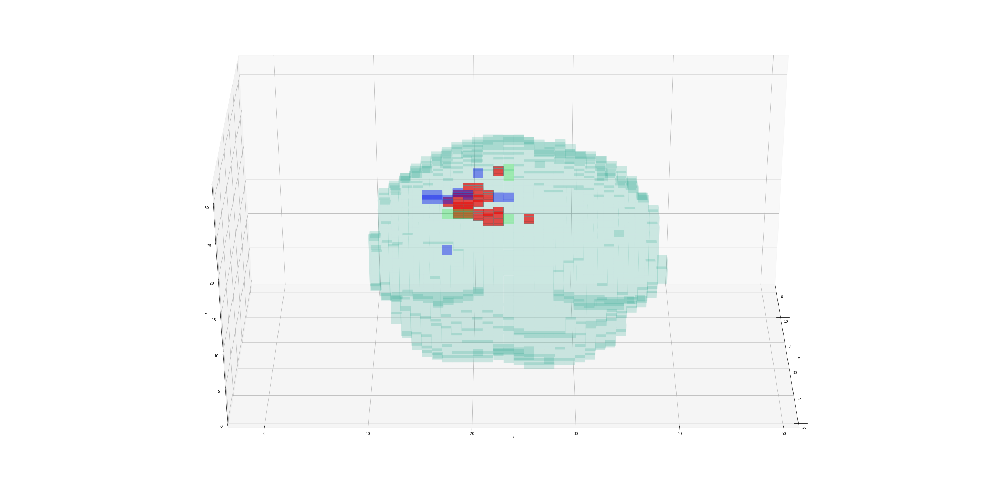

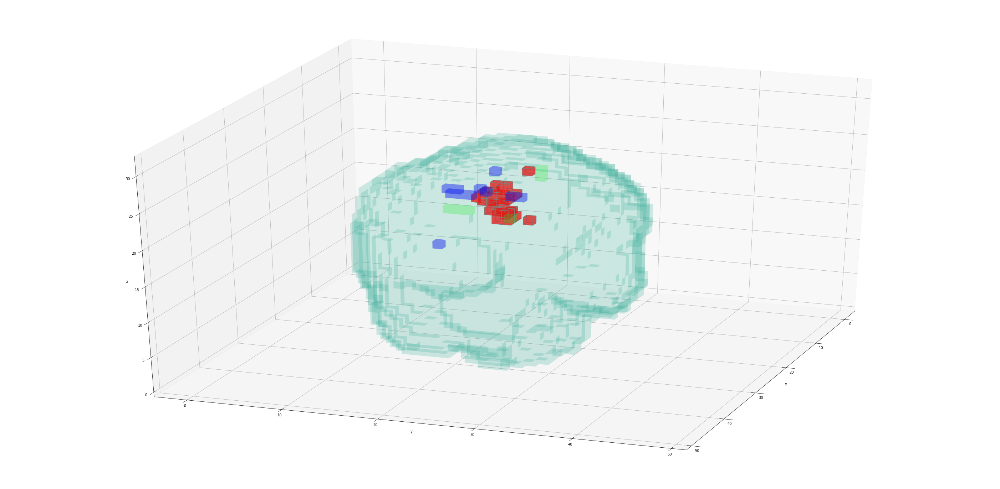

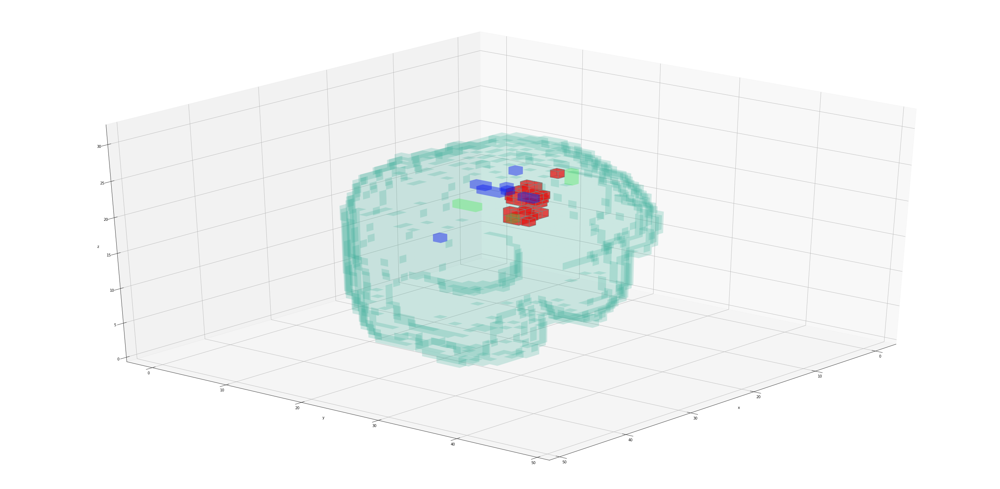

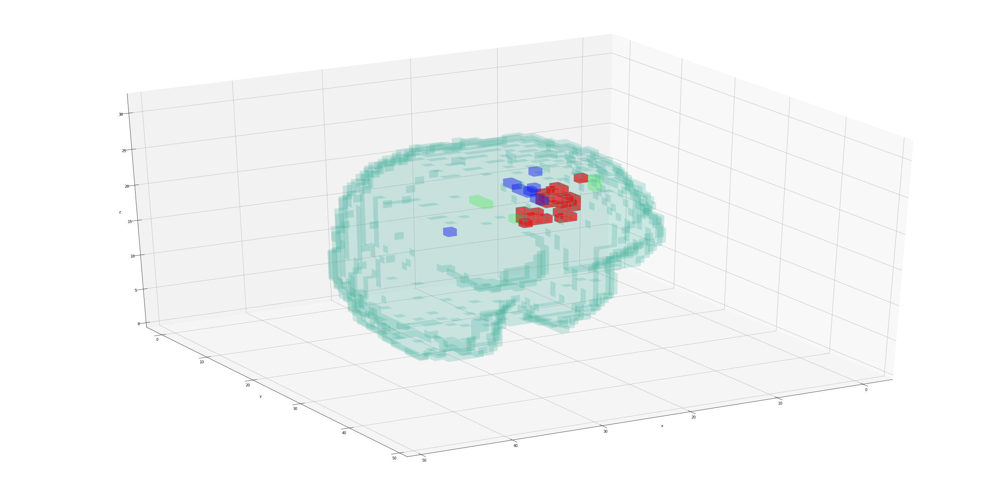

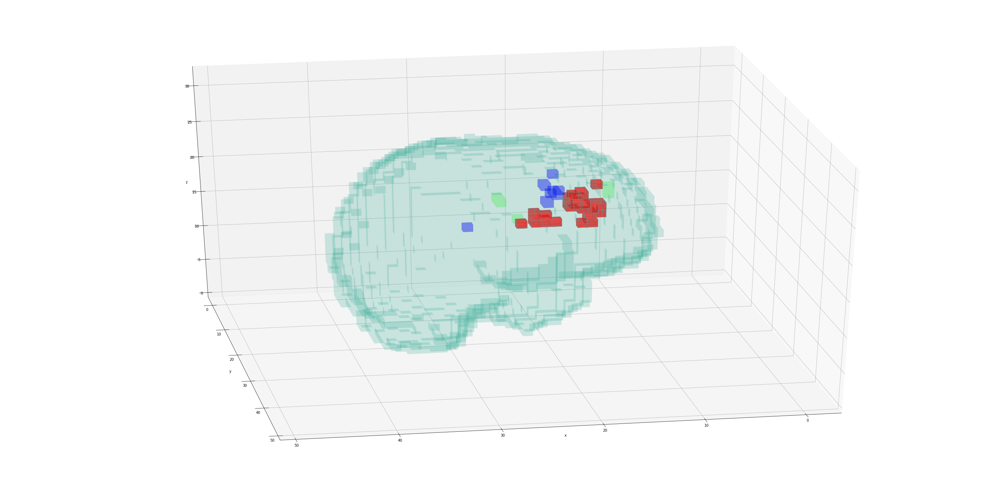

...

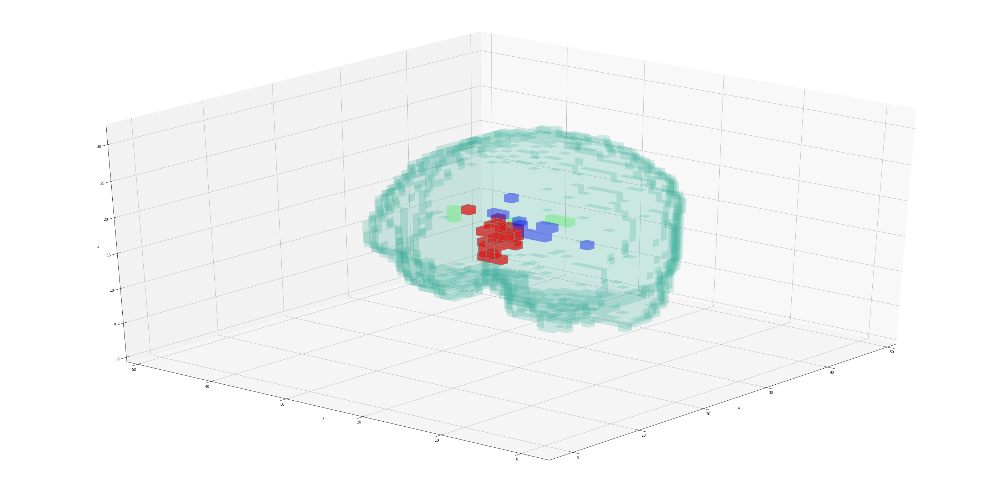

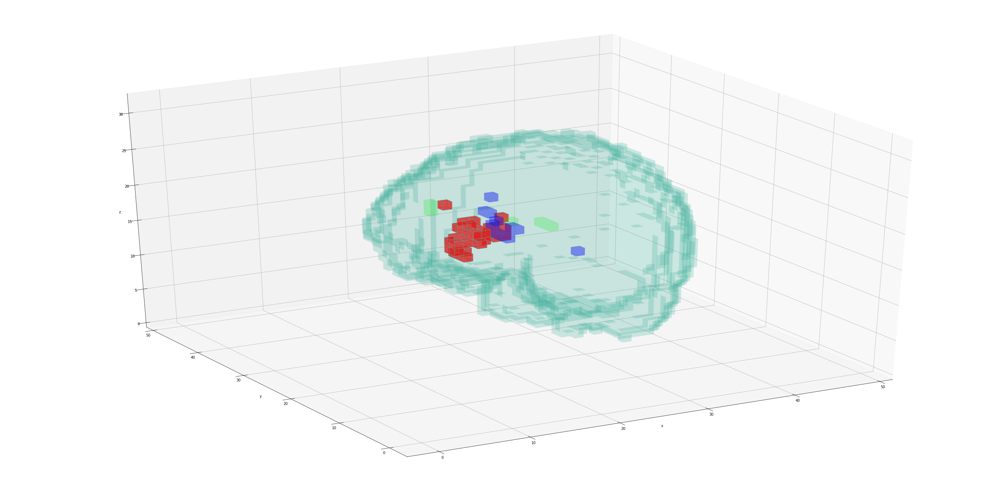

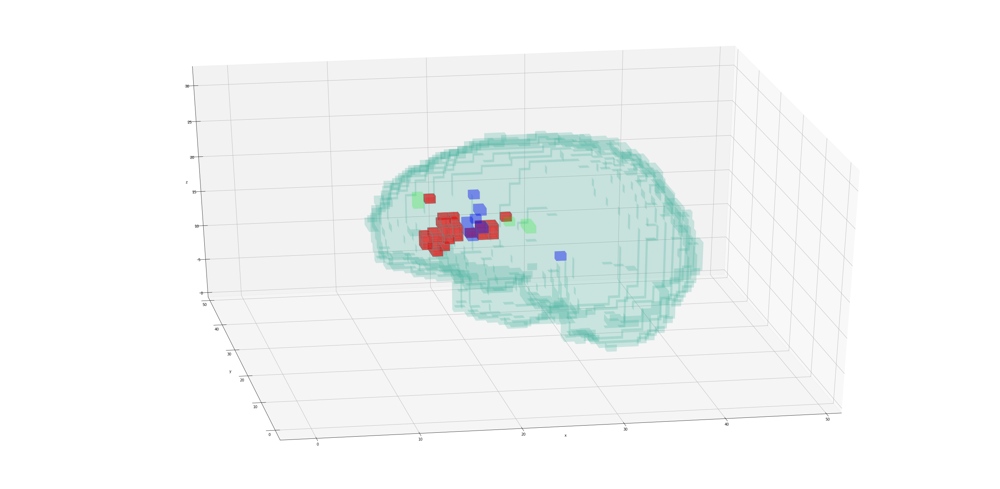

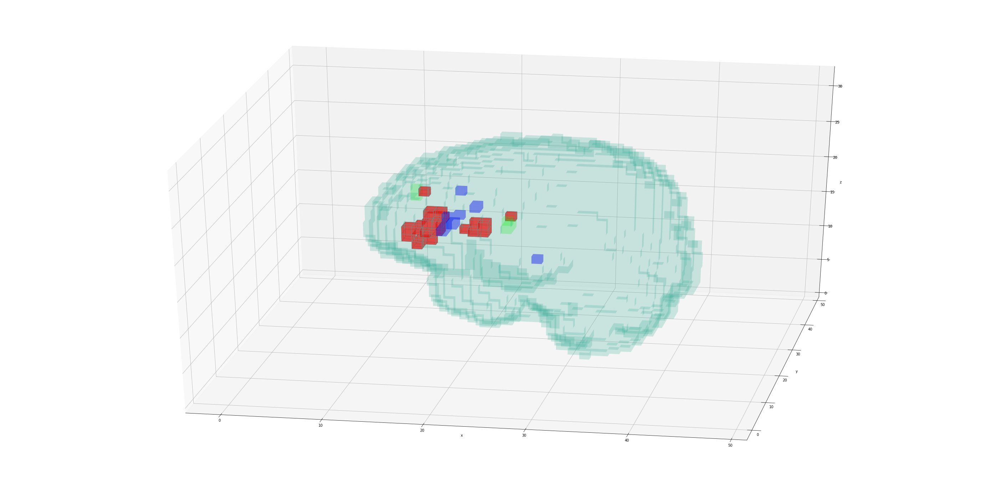

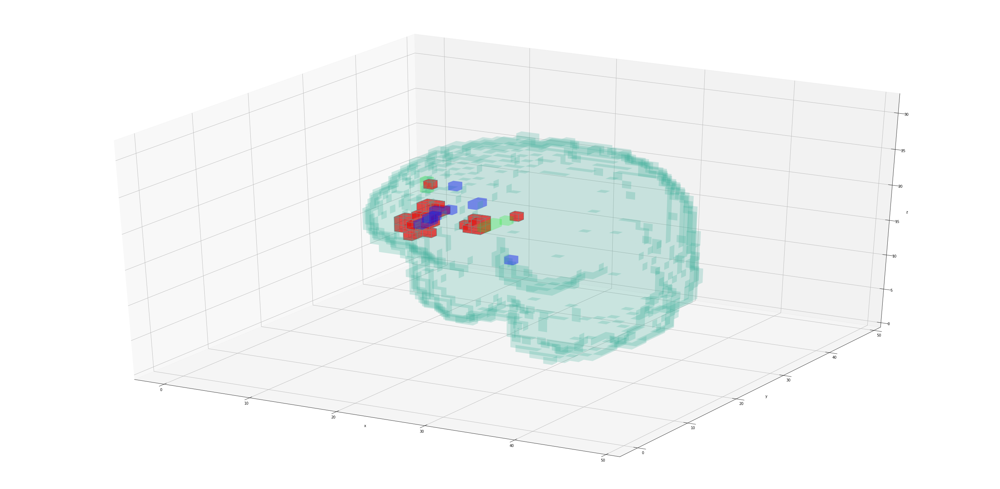

Error in callback <function flush_figures at 0x7f88f77fb440> (for post_execute):


KeyboardInterrupt: ignored

In [59]:
label_names = ['Core', 'Enhancing', 'Edema']
modalities = ['flair', 't1', 't2', 't1ce']
if not os.path.exists('gif_create'):
  os.mkdir('gif_create')
if not os.path.exists('gif'):
  os.mkdir('gif')

angle_num = 20
seg_indices= [1,2,4]
for i, subject in enumerate(val_dataloader):


 # print(subject['seg'].shape)
  name = subject['name'][0]

  prediction = torch.nn.Sigmoid()(ts_model.forward(subject['data'].cuda().half())).cpu().detach().numpy()

  map = tio.LabelMap(tensor=prediction[0] > 0.5)
  map.save(output_file_path + '/' + name + '_prediction'+ '.nii.gz')

  
  adj_seg = tio.LabelMap(tensor=subject['seg'][0, seg_indices] > 0.5)
  adj_seg.save(output_file_path + '/' + name + '_true'+ '.nii.gz')


  mri_data = subject['data'][0]#[0:1]
  mri = tio.ScalarImage(tensor=mri_data) 
  mri.save(output_file_path + '/' + name + '_stacked'+ '.nii.gz')

  for modality_i in range(4):
    mri_data = subject['data'][0][modality_i:modality_i+1]
    mri = tio.ScalarImage(tensor=mri_data) 
    mri.save(output_file_path + '/' + name + '_' + modalities[modality_i]+ '.nii.gz')

  if i < 5: # this takes a really long time, I don't want this to take too much time
    if not os.path.exists('gif_create/'+name):
      os.mkdir('gif_create/'+name)
    gen_gif('gif_create/'+name, prediction[0][0] > 0.5, prediction[0][1] > 0.5, prediction[0][2] > 0.5, mri_chan = mri_data[0] > 0,angle_num = angle_num)
    make_gif('gif_create/'+name, 'gif/' + name + '.gif', angle_num)





In [4]:
from torchio.visualization import plot_volume
import tqdm
import torchio as tio
import sys
import numpy as np
import pytorch_lightning as pl
import torchsummary
import torch
import os
sys.path.append('../Radiology_and_AI')
sys.path.append('../../MedicalZooPytorch')
from lib.medzoo.Unet3D import UNet3D
from lib.losses3D.basic import compute_per_channel_dice, expand_as_one_hot
from torch.utils.data import Dataset, DataLoader, random_split
from pytorch_lightning.loggers import WandbLogger
import matplotlib.pyplot as plt
from collators.col_fn import col_fn

In [438]:
validation_transform = tio.Compose([
    tio.ZNormalization(masking_method=tio.ZNormalization.mean),
    tio.CropOrPad((240, 240, 160)),        
    tio.OneHot(num_classes=5)    
    
])

input_data_path= '../../brats_new/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData'
model_path="../Models/test_train_many_1e-3.pt"
validation_transform=validation_transform

input_channels_list = ['flair','t1','t2','t1ce']
seg_channels = [1,2,4]
model_type = 'UNet3D'
is_validation_data = True
batch_size = 1
num_loading_cpus = 1   
training_split_ratio=0.9
seed=42

#DATASET CREATION
subjects = []
base_dir = input_data_path
for file in tqdm.tqdm([file for file in os.listdir(base_dir) if os.path.isdir(base_dir + '/'+file) == True]):
    paths = [os.path.join(base_dir,file,file+f'_{chan}.nii.gz') for chan in input_channels_list]        
    subject = tio.Subject(            
        data = tio.ScalarImage(path = paths),
        seg = tio.LabelMap(path= [os.path.join(base_dir,file,file+'_seg.nii.gz')]),
        name = file
    )
    subjects.append(subject)        
dataset = tio.SubjectsDataset(subjects)    

if is_validation_data:
    #Splitting datasets into training and validation    
    num_subjects = len(dataset)
    num_training_subjects = int(training_split_ratio * num_subjects)
    num_validation_subjects = num_subjects - num_training_subjects
    num_split_subjects = num_training_subjects, num_validation_subjects
    generator=torch.Generator().manual_seed(seed)
    _, validation_subjects = torch.utils.data.random_split(subjects, num_split_subjects,generator)
    validation_set = tio.SubjectsDataset(validation_subjects, validation_transform)   
else:
    validation_set = tio.SubjectsDataset(dataset, validation_transform)  

model =  UNet3D(in_channels=len(input_channels_list), n_classes=len(seg_channels))
model.load_state_dict(torch.load(model_path))
model.eval()

dataloader = torch.utils.data.DataLoader(
    validation_set,
    batch_size=batch_size,
    num_workers=num_loading_cpus,
    collate_fn=col_fn
)

losses = []
with torch.no_grad():
    for i,batch in tqdm.tqdm(enumerate(dataloader)):
        x= batch['data']
        print(batch['seg'].shape)
        y = torch.cat([batch['seg'][:,x].unsqueeze(dim=1) for x in seg_channels],dim = 1)
        print(y.shape)
        y_hat = torch.nn.Sigmoid()(model.forward(x))
        if i ==4:
            break

100%|██████████| 368/368 [00:00<00:00, 945.59it/s]
0it [00:00, ?it/s]

torch.Size([1, 5, 240, 240, 160])
torch.Size([1, 3, 240, 240, 160])


1it [00:04,  4.91s/it]

torch.Size([1, 5, 240, 240, 160])
torch.Size([1, 3, 240, 240, 160])


2it [00:07,  4.23s/it]

torch.Size([1, 5, 240, 240, 160])
torch.Size([1, 3, 240, 240, 160])


3it [00:10,  3.77s/it]

torch.Size([1, 5, 240, 240, 160])
torch.Size([1, 3, 240, 240, 160])


4it [00:13,  3.50s/it]

torch.Size([1, 5, 240, 240, 160])
torch.Size([1, 3, 240, 240, 160])


4it [00:15,  3.99s/it]


In [449]:
from typing import Optional,Union, Tuple, List
import matplotlib.gridspec as gridspec

#Heavily modified from https://github.com/fepegar/miccai-educational-challenge-2019/blob/master/visualization.py
def plot_volume(
        array: np.ndarray,
        disp_base: bool,
        all_segs: List[int],
        disp_segs: List[int],
        save_path: str,
        base: Optional[np.ndarray] = None,
        title: Optional[str] = None,        
        sag_slice: Optional[int] = None,
        cor_slice: Optional[int] = None,
        axi_slice: Optional[int] = None,
        fig_size : Tuple[int] = (25, 50),
        ):
    si, sj, sk = array.shape[1:4]
    i =  sag_slice if sag_slice is not None else si // 2
    j =  cor_slice if cor_slice is not None else sj // 2
    k =  axi_slice if axi_slice is not None else sk // 2
    slices=[[],[],[]]
    for seg in disp_segs:
        slices[0].append(array[all_segs.index(seg),i, :,:])
        slices[1].append(array[all_segs.index(seg),:, j, :])
        slices[2].append(array[all_segs.index(seg),:, :, k])
    base_slices=[[],[],[]]
    if disp_base:
        for seg in range(base.shape[0]):
            base_slices[0].append(base[seg,i, ...])
            base_slices[1].append(base[seg,:, j, ...])
            base_slices[2].append(base[seg,:, :, k, ...])
            break
    
    cmap = ['gray','summer' ,'autumn', 'winter']
    labels = 'AS', 'RS', 'RA'
    titles = 'Sagittal', 'Coronal', 'Axial'
    
    fig = plt.figure(figsize=(25, 50))
    gs = gridspec.GridSpec(1, 3, width_ratios=[256 / 160, 1, 1])
    ax1 = plt.subplot(gs[0])
    ax2 = plt.subplot(gs[1])
    ax3 = plt.subplot(gs[2])
    axes = ax1, ax2, ax3
    for (base_slice_ ,slice_, axis, label, stitle) in zip(base_slices, slices, axes, labels, titles):
        if len(base_slice_) > 0:
            axis.imshow(turn(base_slice_[0]), cmap=cmap[0])
        for c_ind,layer in enumerate(slice_):
            axis.imshow(turn(np.ma.masked_where(layer == 0, layer)), alpha=0.6,cmap=cmap[c_ind+1],interpolation='none')
        axis.grid(False)
        axis.invert_xaxis()
        axis.invert_yaxis()
        x, y = label
        axis.set_xlabel(x)
        axis.set_ylabel(y)
        axis.set_title(stitle)
        axis.set_aspect('equal')
    if title is not None:
        plt.gcf().suptitle(title)
    plt.tight_layout()
    plt.savefig(save_path)

def turn(array_2d: np.ndarray) -> np.ndarray:
    return np.flipud(np.rot90(array_2d))    


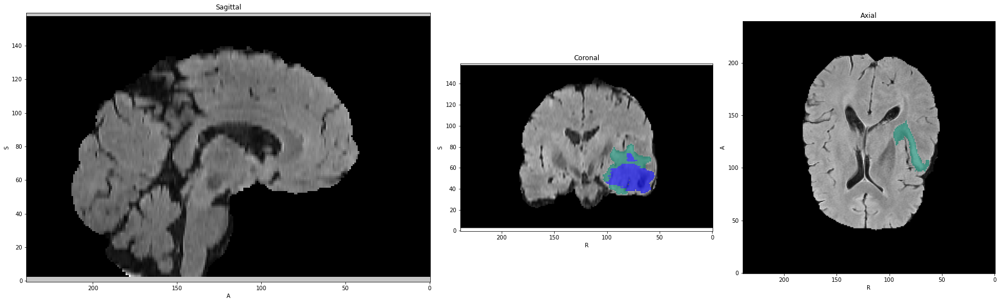

In [446]:
plot_volume(y[0].numpy(),all_segs = [1,2,4], disp_segs=[2,4,1],disp_base=True,base=x[0].numpy())

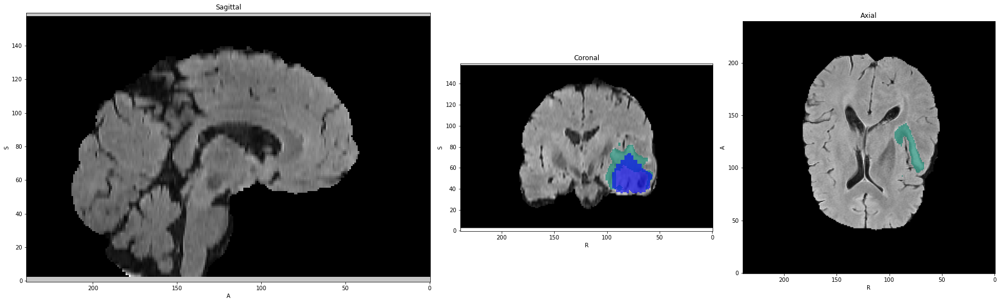

In [441]:
plot_volume(y_hat[0].numpy()>0.5,all_segs = [1,2,4], disp_segs=[2,4,1],disp_base=True,base=x[0].numpy())